## 1D Diffusion

This is step three of '12 Steps to Navier Stokes'.

We solve the equation:

$$ \frac{\partial u}{\partial t} + \nu \frac{\partial^2 u}{\partial x^2} $$

Where $ \nu $ is the kinematic viscosity of the fluid.

The above equation, with some simple math, is discretised to:

$$ u^{n+1}_i = u^n_i + \nu \frac{\Delta t}{\Delta x^2}(u^{n}_{i+1} - 2u^n_i + u^n_{i-1}) $$

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Grid and Inital Conditions

We now use the CFL Condition to calculate the time step.
The initial condition is still a hat function.

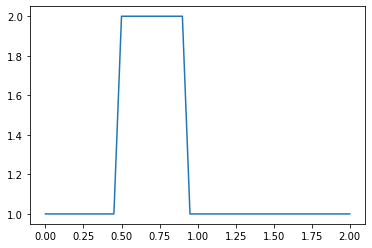

In [2]:
#viscosity and courant number
nu = 0.3 
sigma = 0.2

#set up grid
x_len = 2
num_x = 41
del_x = x_len / (num_x - 1)
num_t = 400
del_t = sigma * del_x**2 / nu

#initial condition is a hat function
u = np.ones(num_x)
u[ int(0.5 / del_x) : int(1 / del_x - 1) ] = 2

plt.plot(np.linspace(0, 2, num_x), u)

### Solve

The equation we need to solve is:

$$u_{i}^{n+1}=u_{i}^{n}+\frac{\nu\Delta t}{\Delta x^2}(u_{i+1}^{n}-2u_{i}^{n}+u_{i-1}^{n})$$

(0.0, 2.0)

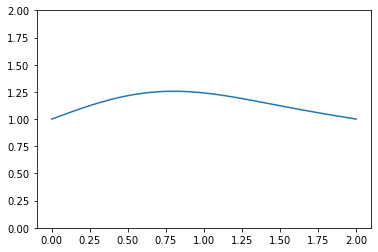

In [3]:
for n in range(num_t):
    u_n = u.copy()
    for i in range(1, num_x - 1):
        u[i] = u_n[i] + (nu*del_t / del_x**2) * (u_n[i+1] - 2*u_n[i] + u_n[i-1])
        
plt.plot(np.linspace(0, 2, num_x), u)
plt.ylim(0, 2)

### Animate

The animation may not display if viewing on Github.

Generate the figure:

Text(0.5, 1.0, '1D Diffusion from t=0 to t=10')

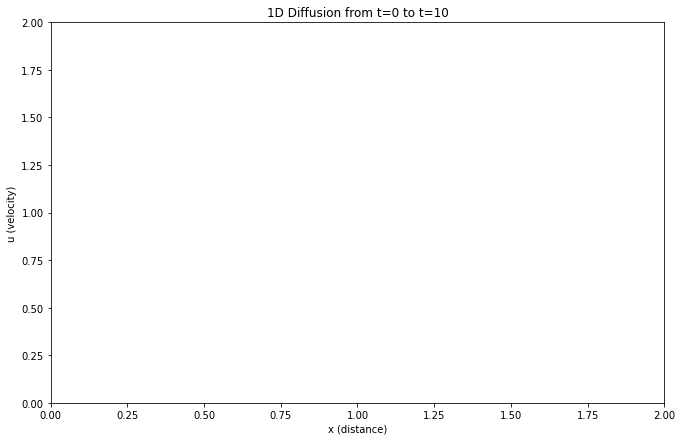

In [4]:
from matplotlib import animation, rc
from IPython.display import HTML

#generate the figure
figure, axes = plt.subplots()
figure.set_size_inches(11, 7)
axes.set_xlim(0, x_len)
axes.set_ylim(0, 2)
line, = axes.plot([], [], lw=2)
plt.xlabel('x (distance)')
plt.ylabel('u (velocity)')
plt.title('1D Diffusion from t=0 to t=10')

Solve and animate:

In [5]:
#reset the initial condition
u = np.ones(num_x)
u[ int(0.5 / del_x) : int(1 / del_x - 1) ] = 2

#animation initialisation function
def initialise_anim():
    line.set_data([], [])
    return (line,)

#animation function which calculates u
#we can remove the outer time loop since this will be handled by the animation library
def animate(j):
    x = np.linspace(0, x_len, num_x)
    u_n = u.copy()
    for i in range(1, num_x - 1):
        u[i] = u_n[i] + (nu*del_t / del_x**2) * (u_n[i+1] - 2*u_n[i] + u_n[i-1])
    line.set_data(x, u)
    return (line,)

#finally, run the animation
anim = animation.FuncAnimation(figure, animate, init_func=initialise_anim, frames=num_t, interval=20)
HTML(anim.to_jshtml())